# Converting speech to text


![speech-recognition](https://editor.analyticsvidhya.com/uploads/75412speech-recognition-python.png)


## Goals:

- Implementation of Amazon Transcribe speech-to-text pipeline
- Analysis of acquired speech recognition results
- Attempt to improve over baseline results


We will be using dataset from this [Medium post](https://medium.com/descript/which-automatic-transcription-service-is-the-most-accurate-2018-2e859b23ed19)


#### Importing libraries


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
from noisereduce import reduce_noise
import pydub
from pydub import AudioSegment
from pydub.effects import normalize
from glob import glob
from deepgram import Deepgram
import importlib
import scipy
import my_secrets as sct
import soundfile as sf
import nltk
import re
import difflib as dl
import json
import boto3
import jiwer
from utils import upload_and_retrieve, create_vocabulary, wait_for_vocabulary

importlib.reload(sct)
tqdm.pandas()

Due to fact that many YouTube links have expired I scraped [Airtable](https://airtable.com/shr1BF9rWJsTE70zZ/tblwP2dpg02WHUA4B/viw79dPwj3BlbsKSi?blocks=hide) via [Airtable Extractor by Table Capture](https://chrome.google.com/webstore/detail/airtable-extractor-by-tab/jdldgiafancpgcleiodepocjobmmfjif) and [Bulk Media Downloader](https://chrome.google.com/webstore/detail/bulk-media-downloader/ehfdcgbfcboceiclmjaofdannmjdeaoi)


In [2]:
df = pd.read_csv("Scraped.csv")
df


,File Name,Reference Transcript,Processed API,Audio,Tags,Ref ID,Results,Youtube Link,Avg WER
0,Trump arrives at Blenheim Palace - BBC News,"Let's bring in Phil Mackie, who is there at th...","1,2,3,5,7,9",https://dl.airtable.com/3bSEwmOTSOgFMAvGExo1_1...,"Unscripted,Broadcast",1,"1,11,112,206,254,303,352,450",https://www.youtube.com/watch?v=9HPshG5IlcI,20.437500000000004
1,Thailand Cave rescue: '11th person brought out...,We are getting reports that 11 people have bee...,"1,2,3,5,7,9",https://dl.airtable.com/ZDut8QxfQJCG6CkUaj5i_2...,"Unscripted,Broadcast",2,"2,12,113,207,255,304,353,451",https://www.youtube.com/watch?v=qmgVQlSzYhw,16.8625
2,Money Clinic: Miami - BBC News,I know that it's something you want to talk ab...,"1,2,3,5,7,9",https://dl.airtable.com/ZenA9U3eTCyxsSci0oea_3...,"Unscripted,Broadcast",3,"3,114,208,256,302,305,354,452",https://www.youtube.com/watch?v=E2h4-I2OLgA,20.125000000000004
3,Sen. Warren: President Donald Trump SCOTUS Nom...,Someone who will be committed to rolling back ...,"1,2,3,5,7,9",https://dl.airtable.com/2vifGcTlQ1y4TjlOY0Vn_4...,"Unscripted,Broadcast",4,"4,14,115,209,257,306,355,453",https://www.youtube.com/watch?v=jRJyyLcKf1g,8.899999999999999
4,Gorka: Dems Upset Over SCOTUS Pick Because It ...,While President Trump weighs his Supreme Court...,"1,2,3,5,7,9",https://dl.airtable.com/Ml2aZnzR5qfUhR5o0Ees_5...,"Unscripted,Broadcast",5,"5,15,116,210,258,307,356,454",https://www.youtube.com/watch?v=az9td4mARt0,13.075000000000001
5,Anderson Cooper: Trump's victory lap is bogus,There's breaking news tonight on the President...,"1,2,3,5,7,9",https://dl.airtable.com/NKsmNfxkQ6OZwyKINLjn_6...,"Unscripted,Broadcast",6,"6,16,117,211,259,308,357,455",https://www.youtube.com/watch?v=3aFgcae43qE,12.225
6,Ivan Perisic penalty decision Did referee get ...,"We asked you on twitter, whether or not a hand...","1,2,3,5,7,9",https://dl.airtable.com/KGHNNivCTR7dZN9JSbmv_7...,"Unscripted,Broadcast",7,"7,17,118,212,260,309,358,456",https://www.youtube.com/watch?v=sRdDIrRcwio,28.437499999999996
7,Stephen A. explains why Lakers can compete wit...,We know who the real heavyweights are in the w...,"1,2,3,5,7,9",https://dl.airtable.com/XSp8w6xeRQaVi6YLg7qQ_8...,"Unscripted,Broadcast",8,"8,18,119,213,261,310,359,457",https://www.youtube.com/watch?v=3hviQNGi8RY,15.45
8,Why Messi and Ronaldo haven't won the World Cu...,"For over a decade, on streets, and in bars, an...","1,2,3,5,7,9",https://dl.airtable.com/YbTtgEESoOKtHJR72ZyJ_9...,"Scripted,Broadcast",9,"9,19,120,214,262,311,360,458",https://www.youtube.com/watch?v=1-rCUH1zn1o,15.6125
9,"Will Cain, Ryan Hollins debate whether LeBron ...",Do you think Mr. LeBron James will be patient ...,"1,2,3,5,7,9",https://dl.airtable.com/sXqL6mP3S9ybMawWg04v_1...,"Unscripted,Broadcast",10,"10,20,121,215,263,312,361,459",https://www.youtube.com/watch?v=43AlD13scgY,16.1625


### Assign audio files


In [3]:
audio_files = glob(r"*.m4a")

def assign_audio(x):
    for file in audio_files:
        if "_" + str(x) in file:
            return pd.Series([AudioSegment.from_file(file), file])

### Cleaning table


In [5]:
df = df.drop(index=[47, 46])
df["id"] = range(len(df))
df[["audio", "path"]] = df.id.apply(assign_audio)
df = df.drop(columns=["id", "Ref ID", "Processed API", "Audio", "Results"])
df.columns = [
    "file_name",
    "professional_transcript",
    "tags",
    "link",
    "scraped_WER",
    "audio",
    "path",
]
df.head()

,file_name,professional_transcript,tags,link,scraped_WER,audio,path
0,Trump arrives at Blenheim Palace - BBC News,"Let's bring in Phil Mackie, who is there at th...","Unscripted,Broadcast",https://www.youtube.com/watch?v=9HPshG5IlcI,20.437500000000004,(((<pydub.audio_segment.AudioSegment object at...,_0.m4a
1,Thailand Cave rescue: '11th person brought out...,We are getting reports that 11 people have bee...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=qmgVQlSzYhw,16.8625,(((<pydub.audio_segment.AudioSegment object at...,_1.m4a
2,Money Clinic: Miami - BBC News,I know that it's something you want to talk ab...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=E2h4-I2OLgA,20.125000000000004,(((<pydub.audio_segment.AudioSegment object at...,_2.m4a
3,Sen. Warren: President Donald Trump SCOTUS Nom...,Someone who will be committed to rolling back ...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=jRJyyLcKf1g,8.899999999999999,(((<pydub.audio_segment.AudioSegment object at...,_3.m4a
4,Gorka: Dems Upset Over SCOTUS Pick Because It ...,While President Trump weighs his Supreme Court...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=az9td4mARt0,13.075000000000001,(((<pydub.audio_segment.AudioSegment object at...,_4.m4a


In [87]:
print(f"We have {df.shape[0]} record in our dataset plus 1 testing record")

We have 46 record in our dataset plus 1 testing record


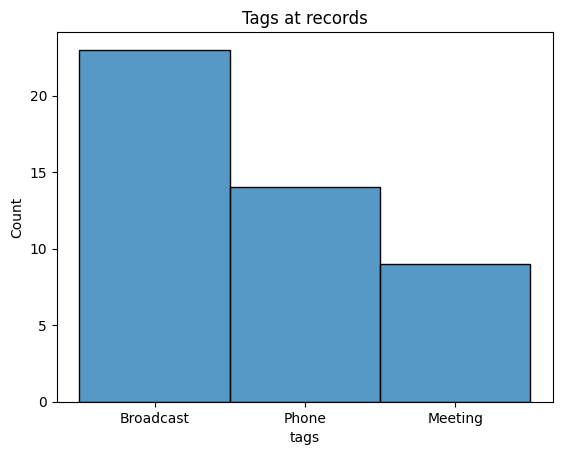

In [95]:
sns.histplot(df.tags.apply(lambda x: x.split(",")[-1]))
plt.title("Tags at records")

We have 3 types of record: Broadcast, phone-call and meeting


#### Example audio


In [6]:
df["audio"][0]


Due to [AWS Transcribe](https://aws.amazon.com/transcribe/) service requirements we export .m4a to .flac files via [pydub](https://github.com/jiaaro/pydub)


In [6]:
for f in audio_files:
    audio = AudioSegment.from_file(f, format="m4a")
    audio.export(f.replace("m4a", "flac"), format="flac")

df["path_flac"] = df["path"].apply(lambda x: x.replace("m4a", "flac"))

We will be using [boto3](https://boto3.amazonaws.com/v1/documentation/api/latest/index.html) - AWS SDK for Python to communicate with [AWS Transcribe](https://aws.amazon.com/transcribe/)


In [50]:
sqs = boto3.resource(
    "sqs",
    region_name="eu-west-2",
    aws_access_key_id=sct.ACCESS_ID,
    aws_secret_access_key=sct.ACCESS_KEY,
)
queue = sqs.create_queue(QueueName="test", Attributes={"DelaySeconds": "5"})
print(queue.url)
print(queue.attributes.get("DelaySeconds"))

https://sqs.eu-west-2.amazonaws.com/101959024883/test
5


#### Creating bucket


In [ ]:
session = boto3.Session(
    aws_access_key_id=sct.ACCESS_ID, aws_secret_access_key=sct.ACCESS_KEY
)
bucket_name = "biomapas"
s3_client = session.client("s3")
s3_client.create_bucket(
    Bucket=bucket_name, CreateBucketConfiguration={"LocationConstraint": "eu-west-2"}
)

#### Uploading files


In [56]:
def upload_to_s3(f):
    s3_client.upload_file(f, bucket_name, f.split("\\")[-1])


df["path_flac"].apply(upload_to_s3)

#### Transcribing files


In [57]:
transcribe_client = boto3.client(
    "transcribe",
    region_name="eu-west-2",
    aws_access_key_id=sct.ACCESS_ID,
    aws_secret_access_key=sct.ACCESS_KEY,
)

In [21]:
backslash_char = "\\"


def transcribe(path):
    file_name = path.split(backslash_char)[-1].split(".")[0]
    transcribe_client.start_transcription_job(
        TranscriptionJobName=f"transcribing_{file_name}",
        LanguageCode="en-US",
        MediaFormat="flac",
        Media={"MediaFileUri": f"s3://{bucket_name}/{file_name}.flac"},
        OutputBucketName="biomapas",
        OutputKey=f"{file_name}.txt",
    )


df["path_flac"].apply(transcribe)

#### Downloading transcription


In [8]:
def get_file_content(path):
    with open(f"{path.split(backslash_char)[-1].split('.')[0]}.txt") as f:
        out = ""
        for line in f:
            out += line
    return out


df["AWS_response"] = df["path"].apply(get_file_content)
df.head()

,file_name,professional_transcript,tags,link,scraped_WER,audio,path,path_flac,AWS_response
0,Trump arrives at Blenheim Palace - BBC News,"Let's bring in Phil Mackie, who is there at th...","Unscripted,Broadcast",https://www.youtube.com/watch?v=9HPshG5IlcI,20.437500000000004,(((<pydub.audio_segment.AudioSegment object at...,_0.m4a,_0.flac,"{""jobName"":""transcribing__0_1686323244"",""accou..."
1,Thailand Cave rescue: '11th person brought out...,We are getting reports that 11 people have bee...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=qmgVQlSzYhw,16.8625,(((<pydub.audio_segment.AudioSegment object at...,_1.m4a,_1.flac,"{""jobName"":""transcribing__1_1686323082"",""accou..."
2,Money Clinic: Miami - BBC News,I know that it's something you want to talk ab...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=E2h4-I2OLgA,20.125000000000004,(((<pydub.audio_segment.AudioSegment object at...,_2.m4a,_2.flac,"{""jobName"":""transcribing__2"",""accountId"":""1921..."
3,Sen. Warren: President Donald Trump SCOTUS Nom...,Someone who will be committed to rolling back ...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=jRJyyLcKf1g,8.899999999999999,(((<pydub.audio_segment.AudioSegment object at...,_3.m4a,_3.flac,"{""jobName"":""transcribing__3"",""accountId"":""1921..."
4,Gorka: Dems Upset Over SCOTUS Pick Because It ...,While President Trump weighs his Supreme Court...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=az9td4mARt0,13.075000000000001,(((<pydub.audio_segment.AudioSegment object at...,_4.m4a,_4.flac,"{""jobName"":""transcribing__4"",""accountId"":""1921..."


#### Extracting content


In [10]:
def extract_transcript(response):
    return json.loads(response)["results"]["transcripts"][0]["transcript"]


df["AWS_transcript"] = df["AWS_response"].apply(extract_transcript)
df.head()

,file_name,professional_transcript,tags,link,scraped_WER,audio,path,path_flac,AWS_response,AWS_transcript
0,Trump arrives at Blenheim Palace - BBC News,"Let's bring in Phil Mackie, who is there at th...","Unscripted,Broadcast",https://www.youtube.com/watch?v=9HPshG5IlcI,20.437500000000004,(((<pydub.audio_segment.AudioSegment object at...,_0.m4a,_0.flac,"{""jobName"":""transcribing__0_1686323244"",""accou...",Let's bring in Phil Mackey who is there at the...
1,Thailand Cave rescue: '11th person brought out...,We are getting reports that 11 people have bee...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=qmgVQlSzYhw,16.8625,(((<pydub.audio_segment.AudioSegment object at...,_1.m4a,_1.flac,"{""jobName"":""transcribing__1_1686323082"",""accou...",We are getting reports that 11 people have bee...
2,Money Clinic: Miami - BBC News,I know that it's something you want to talk ab...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=E2h4-I2OLgA,20.125000000000004,(((<pydub.audio_segment.AudioSegment object at...,_2.m4a,_2.flac,"{""jobName"":""transcribing__2"",""accountId"":""1921...",I know it's something you wanna talk about. I'...
3,Sen. Warren: President Donald Trump SCOTUS Nom...,Someone who will be committed to rolling back ...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=jRJyyLcKf1g,8.899999999999999,(((<pydub.audio_segment.AudioSegment object at...,_3.m4a,_3.flac,"{""jobName"":""transcribing__3"",""accountId"":""1921...",Someone who will be committed to rolling back ...
4,Gorka: Dems Upset Over SCOTUS Pick Because It ...,While President Trump weighs his Supreme Court...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=az9td4mARt0,13.075000000000001,(((<pydub.audio_segment.AudioSegment object at...,_4.m4a,_4.flac,"{""jobName"":""transcribing__4"",""accountId"":""1921...",While President Trump weighs his Supreme Court...


#### Calculating word error rate (WER) and character error rate (CER)


We will be using our own WER and CER scores because we don't know how author came up with their results.


We will be calculating WER and CER with usage of [nltk](https://pypi.org/project/nltk/), but results from [jiwer](https://github.com/jitsi/jiwer) were added to comparison.


In [11]:
df["wer_score_jiwer"] = df.apply(
    lambda x: jiwer.wer(x.professional_transcript, x.AWS_transcript), axis=1
)
df["cer_score_jiwer"] = df.apply(
    lambda x: jiwer.cer(x.professional_transcript, x.AWS_transcript), axis=1
)

In [12]:
def calculate_wer(reference, hypothesis):
    # Tokenize the reference and hypothesis texts into words
    ref_words = nltk.word_tokenize(reference.lower())
    hyp_words = nltk.word_tokenize(hypothesis.lower())

    # Compute the WER using NLTK's edit_distance function
    wer = nltk.edit_distance(ref_words, hyp_words) / len(ref_words)

    return wer


def calculate_cer(reference, hypothesis):
    # Convert the reference and hypothesis strings to lowercase
    reference = reference.lower()
    hypothesis = hypothesis.lower()

    # Calculate the Levenshtein distance between the reference and hypothesis
    distance = levenshtein_distance(reference, hypothesis)

    # Compute the CER
    cer = distance / len(reference)

    return cer


def levenshtein_distance(s1, s2):
    # Create a matrix with dimensions (len(s1)+1) x (len(s2)+1)
    matrix = [[0] * (len(s2) + 1) for _ in range(len(s1) + 1)]

    # Initialize the first row and column of the matrix
    for i in range(len(s1) + 1):
        matrix[i][0] = i
    for j in range(len(s2) + 1):
        matrix[0][j] = j

    # Fill in the rest of the matrix
    for i in range(1, len(s1) + 1):
        for j in range(1, len(s2) + 1):
            if s1[i - 1] == s2[j - 1]:
                matrix[i][j] = matrix[i - 1][j - 1]
            else:
                substitution_cost = matrix[i - 1][j - 1] + 1
                insertion_cost = matrix[i][j - 1] + 1
                deletion_cost = matrix[i - 1][j] + 1
                matrix[i][j] = min(substitution_cost, insertion_cost, deletion_cost)

    # The bottom-right element of the matrix contains the Levenshtein distance
    return matrix[len(s1)][len(s2)]


df["wer_score"] = df.apply(
    lambda x: calculate_wer(x.professional_transcript, x.AWS_transcript), axis=1
)
df["cer_score"] = df.apply(
    lambda x: calculate_cer(x.professional_transcript, x.AWS_transcript), axis=1
)
df.head()

,file_name,professional_transcript,tags,link,scraped_WER,audio,path,path_flac,AWS_response,AWS_transcript,wer_score_jiwer,cer_score_jiwer,wer_score,cer_score
0,Trump arrives at Blenheim Palace - BBC News,"Let's bring in Phil Mackie, who is there at th...","Unscripted,Broadcast",https://www.youtube.com/watch?v=9HPshG5IlcI,20.437500000000004,(((<pydub.audio_segment.AudioSegment object at...,_0.m4a,_0.flac,"{""jobName"":""transcribing__0_1686323244"",""accou...",Let's bring in Phil Mackey who is there at the...,0.210011,0.094478,0.162579,0.086396
1,Thailand Cave rescue: '11th person brought out...,We are getting reports that 11 people have bee...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=qmgVQlSzYhw,16.8625,(((<pydub.audio_segment.AudioSegment object at...,_1.m4a,_1.flac,"{""jobName"":""transcribing__1_1686323082"",""accou...",We are getting reports that 11 people have bee...,0.103383,0.031839,0.067500,0.028033
2,Money Clinic: Miami - BBC News,I know that it's something you want to talk ab...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=E2h4-I2OLgA,20.125000000000004,(((<pydub.audio_segment.AudioSegment object at...,_2.m4a,_2.flac,"{""jobName"":""transcribing__2"",""accountId"":""1921...",I know it's something you wanna talk about. I'...,0.231365,0.130855,0.198587,0.123606
3,Sen. Warren: President Donald Trump SCOTUS Nom...,Someone who will be committed to rolling back ...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=jRJyyLcKf1g,8.899999999999999,(((<pydub.audio_segment.AudioSegment object at...,_3.m4a,_3.flac,"{""jobName"":""transcribing__3"",""accountId"":""1921...",Someone who will be committed to rolling back ...,0.137615,0.040471,0.094296,0.033882
4,Gorka: Dems Upset Over SCOTUS Pick Because It ...,While President Trump weighs his Supreme Court...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=az9td4mARt0,13.075000000000001,(((<pydub.audio_segment.AudioSegment object at...,_4.m4a,_4.flac,"{""jobName"":""transcribing__4"",""accountId"":""1921...",While President Trump weighs his Supreme Court...,0.240535,0.073958,0.158759,0.063197


In [106]:
df["scraped_WER"] = df["scraped_WER"].apply(float) / 100
print(f"scraped WER score:{df.scraped_WER.apply(float).mean()}")
print(f"base WER score:{df.wer_score.mean()}")
print(f"jiwer WER score:{df.wer_score_jiwer.mean()}\n")
print(f"base CER score:{df.cer_score.mean()}")
print(f"jiwer CER score:{df.cer_score_jiwer.mean()}")

scraped WER score:0.2403396739130435
base WER score:0.20142871274855445
jiwer WER score:0.27249614743707473

base CER score:0.10423743088525673
jiwer CER score:0.11404166385628262


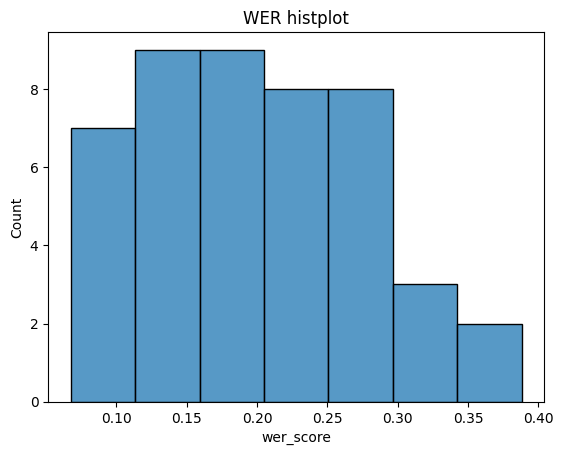

In [83]:
sns.histplot(df.wer_score)
plt.title("WER histplot")

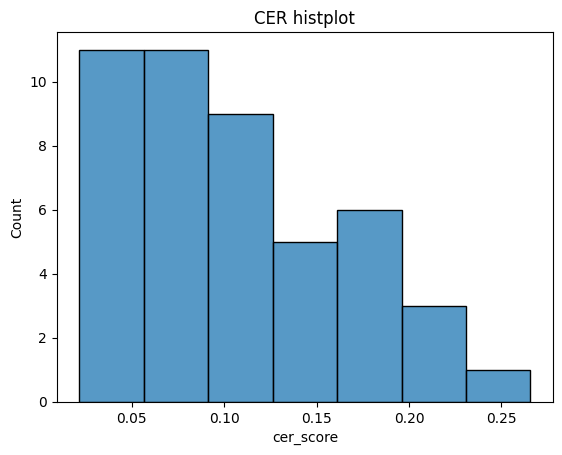

In [84]:
sns.histplot(df.cer_score)
plt.title("CER histplot")

As we can see our WER and CER scores are pretty low already, so we don't have large room for manoeuvre


### Analysing result


Using [difflib](https://docs.python.org/3/library/difflib.html) to compare translations


In [ ]:
index = 0
for diff in dl.unified_diff(
    nltk.word_tokenize(df["professional_transcript"][index].lower()),
    nltk.word_tokenize(df["AWS_transcript"][index].lower()),
):
    print(diff)

--- 

+++ 

@@ -3,8 +3,7 @@

 bring
 in
 phil
-mackie
-,
+mackey
 who
 is
 there
@@ -20,8 +19,13 @@

 and
 philip
 may
-.
+,
 philip
+.
+and
+can
+you
+see
 ,
 can
 you
@@ -29,7 +33,7 @@

 how
 he
 's
-being
+been
 transferred
 from
 the
@@ -38,21 +42,22 @@

 it
 looks
 like
-,
 as
 you
 said
 ,
 the
 beast
-.
+,
+it
+'s
+,
 it
 's
 got
 its
 headlights
 on
-,
 because
 the
 sun
@@ -61,14 +66,12 @@

 to
 set
 now
-.
-it
-'s
+,
 certainly
 sinking
 behind
 some
-clouds
+cloud
 .
 it
 's
@@ -88,7 +91,7 @@

 into
 the
 courtyard
-,
+.
 so
 you
 've
@@ -103,10 +106,9 @@

 and
 her
 husband
-,
 philip
 may
-.
+,
 they
 are
 now
@@ -123,7 +125,7 @@

 itself
 is
 still
-parked
+part
 .
 i
 ca
@@ -154,14 +156,13 @@

 little
 bit
 late
-,
+.
 i
 think
 you
 probably
 noticed
-,
-cathy
+katy
 and
 christian
 .
@@ -185,12 +186,12 @@

 that
 all
 the
-vips
-,
+vip
+s
 members
 of
 the
-cabinets
+cabinet
 ,
 the
 business
@@ -250,7 +251,6 @@

 short
 time
 ago
-,
 just
 in
 time
@@ -267,7 +267,6 @@

#### Analysing worst example


In [142]:
df[df["wer_score"] == df["wer_score"].max()]


,file_name,professional_transcript,tags,link,scraped_WER,audio,path,AWS_response,AWS_transcript,wer_score,cer_score,wer_score_jiwer,cer_score_jiwer,deepgram_transcript,wer_score_deepgram,cer_score_deepgram
12,Podcast #185 - Drunk Stories,"Right now guys, start your web and let's talk ...","Unscripted,Broadcast",https://www.youtube.com/watch?v=UtzQoq3Ln68,0.39775,(((<pydub.audio_segment.AudioSegment object at...,_12.m4a,"{""jobName"":""transcribing__12"",""accountId"":""192...","Right now, guys, start your website that you a...",0.388119,0.265706,0.501458,0.276571,"Right now, guys, start your website that you g...",0.376238,0.255078


In [143]:
df["professional_transcript"][12]


'Right now guys, start your web and let\'s talk about going to Sqarespace.com/jennajulien. Save 10% of your first purchase of a website or domain. Squarespace has 24/7 customer support and many different templates to help you start your dream website. You will not be disappointed.\nAlso, guys, quick, the wonderful toothbrush system that lives in the future alongside you. They send you refills every month of brush heads and right now, guys, it starts at just $25, and you can get your refill first on us. \nThat\'s what I\'m talking about!\nYour first refill of the brush head for free because you watched this podcast. Go to getquip.com/jennajulien. That\'s getquip.com/jennajulien or click the link in the description.\nI don\'t even know where to look at you because I can\'t see your eyes.\nI like that.\nStop! You\'re making me...no. No.\nAlright. Alright. Alright.\nYou\'re going to scare Bob. \nAlright. Alright.\nBob! Bob! \nWe\'ll leave it right there.\nYou\'ve scared him by setting it d

In [144]:
df["AWS_transcript"][12]


"Right now, guys, start your website that you always want to start by going to squarespace dot com slash Jenna Julian. Save 10% of your first purchase of a website or domain. Squarespace has 24 7 customer support and many different templates to help you start your dream website. You will not be disappointed. Also, guys quip the wonderful toothbrush system that lives in the future alongside you. They send you refills every month of uh brush heads. And right now guys, it starts at just $25 and you can get your refill first on us. That's about your first refill of a brush head for free because you watch this podcast, go to get quip dot com slash engine that's get quip dot com slash angel or click the link in the description. I don't even know like where to look at you because I can't see your eyes like that. Stop. It's gonna be boo boo. All right. All right, you're gonna scare Bob Bob Bob. He scared him by setting it down. He's nervous now. He's just a little baba goose. I gotta adjust my

The first thing that strikes is the incorrect spelling of names


In [16]:
df["professional_transcript"][0]


"Let's bring in Phil Mackie, who is there at the palace. We're looking at Theresa and Philip May. Philip, can you see how he's being transferred from the helicopters?\n\nIt looks like, as you said, the Beast. It's got its headlights on, because the sun is beginning to set now. It's certainly sinking behind some clouds. It's about a quarter of a mile away down the grand drive leading up into the courtyard, so you've seen the pictures there of the Prime Minister and her husband, Philip May. They are now awaiting the arrival. I can see that the limousine itself is still parked. I can't see any movement in the distance there to see whether or not the President is on his way. This is running a little bit late, I think you probably noticed, Cathy and Christian. We were expecting this to have happened a good 15 minutes or so ago, which means that all the VIPs, members of the cabinets, the business leaders have had to stand there for about 20 minutes. It's not a cold evening by any means, but 

In [17]:
df["AWS_transcript"][0]


"Let's bring in Phil Mackey who is there at the palace. We're looking at Theresa and Philip May, Philip. And can you see, can you see how he's been transferred from the helicopters? It looks like as you said, the beast, it's, it's got its headlights on because the sun is beginning to set now, certainly sinking behind some cloud. It's about a quarter of a mile away down the grand drive leading up into the courtyard. So you've seen the pictures there of the Prime Minister and her husband Philip May, they are now awaiting the arrival. I can see that the limousine itself is still part. I can't see any movement in the distance there to see whether or not the president is on his way. This is running a little bit late. I think you probably noticed Katy and Christian. We were expecting this to have happened a good 15 minutes or so ago, which means that all the VIP S members of the cabinet, the business leaders have had to stand there for about 20 minutes. It's not a cold evening by any means, 

Current result for this record


In [18]:
calculate_wer(df["professional_transcript"][0], df["AWS_transcript"][0])

0.16257947320617622

We also could see some added translator's notes which negatively affects WER.


In [19]:
pattern = r"\[([^]]+)\]"
df["professional_transcript"].apply(
    lambda x: print(re.findall(pattern, x)) if re.findall(pattern, x) else None
)

['inaudible 00:02:37', 'inaudible 00:02:55', 'inaudible 00:03:13', 'inaudible 00:03:36', 'inaudible 00:04:44', 'inaudible 00:04:57']
['inaudible 00:03:21']
['inaudible 00:02:33', 'inaudible 00:03:33']


In [20]:
calculate_wer(
    re.sub(pattern, "", df["professional_transcript"][0]), df["AWS_transcript"][0]
)

0.14856081708449395

After reading further into both scripts, we can see that AWS transcribe, unlike humans, does not use special characters in its translations


In [22]:
sign = "-"
print(
    f'AWS_transcript "{sign}" count: {df.AWS_transcript.apply(lambda string: string.count(sign)).sum()}'
)
print(
    f'Professional_transcript "{sign}" count: {df.professional_transcript.apply(lambda string: string.count(sign)).sum()}'
)

AWS_transcript "-" count: 5
Professional_transcript "-" count: 308


In [23]:
sign = "..."
print(
    f'AWS_transcript "{sign}" count: {df.AWS_transcript.apply(lambda string: string.count(sign)).sum()}'
)
print(
    f'Professional_transcript "{sign}" count: {df.professional_transcript.apply(lambda string: string.count(sign)).sum()}'
)

AWS_transcript "..." count: 0
Professional_transcript "..." count: 123


In [35]:
sign = '"'
print(
    f'AWS_transcript "{sign}" count: {df.AWS_transcript.apply(lambda string: string.count(sign)).sum()}'
)
print(
    f'Professional_transcript "{sign}" count: {df.professional_transcript.apply(lambda string: string.count(sign)).sum()}'
)

AWS_transcript """ count: 0
Professional_transcript """ count: 145


In [59]:
sign = "!"
print(
    f'AWS_transcript "{sign}" count: {df.AWS_transcript.apply(lambda string: string.count(sign)).sum()}'
)
print(
    f'Professional_transcript "{sign}" count: {df.professional_transcript.apply(lambda string: string.count(sign)).sum()}'
)

AWS_transcript "!" count: 0
Professional_transcript "!" count: 28


In some cases, we may notice that a person on the recording stammers or repeats a word. AWS Transcribe will enter the repetition, while the person writing the transcript will omit it.


Another thing is the intrusions: um, hm, e, m etc. These occur both in the original transcript and in the automatic translation. Although AWS transcribes these intrusions more often.


In [70]:
sign = " em"
print(
    f'AWS_transcript "{sign}" count: {df.AWS_transcript.apply(lambda string: string.count(sign)).sum()}'
)
print(
    f'Professional_transcript "{sign}" count: {df.professional_transcript.apply(lambda string: string.count(sign)).sum()}'
)

AWS_transcript " em" count: 37
Professional_transcript " em" count: 29


In [68]:
sign = " um"
print(
    f'AWS_transcript "{sign}" count: {df.AWS_transcript.apply(lambda string: string.count(sign)).sum()}'
)
print(
    f'Professional_transcript "{sign}" count: {df.professional_transcript.apply(lambda string: string.count(sign)).sum()}'
)

AWS_transcript " um" count: 108
Professional_transcript " um" count: 90


We can also note that transcripts differ in the way numbers are written, sometimes they are written as digits, e.g. '19' and sometimes as the written number 'nineteen'.


### Attempts to reduce WER


We can certainly make changes to the original transcript to reduce WER. We can remove special characters or inclusions, but this does not improve the translation in any way, so we will not do it.


#### Repetition


As indicated earlier in the text, we see a lot of repetition.


In [61]:
index = 12
while True:
    index = index + 1
    try:
        text = nltk.word_tokenize(df["AWS_transcript"][index].lower())
        for i, word in enumerate(text):
            try:
                if word == text[i + 1]:
                    print(word)
            except IndexError:
                pass
    except:
        break

jpeg
is
budget
an
phone
because
remember
m
mean
that
uh
mick
uh
that
uh
in
go
this
uh
night
uh
blakely
uh
that
the
an
an
toothbrush
had
that
blow
uh
e
e
what
that
is


We can try to compensate for them which will slightly increase the WER.


In [27]:
def remove_duplicates(string):
    words = string.split()
    result = [words[0]]

    for word in words[1:]:
        if word != result[-1]:
            result.append(word)

    return " ".join(result)

In [30]:
out = 0
for index in range(47):
    out += calculate_wer(
        df["corrected_professional_transcript"][index], df["AWS_transcript"][index]
    ) - calculate_wer(
        df["corrected_professional_transcript"][index],
        remove_duplicates(df["AWS_transcript"][index]),
    )
print(out)

0.06321588534402718


Unfortunately, by automatically removing the repeats, a certain amount of information is lost. Despite the reduction in WER, the quality of the translation is worse


#### Numbers conversion


Another option is to change the form in which the numbers are written


In [34]:
def words_to_number(text):
    # Define word-to-number mappings
    number_words = {
        "zero": "0",
        "one": "1",
        "two": "2",
        "three": "3",
        "four": "4",
        "five": "5",
        "six": "6",
        "seven": "7",
        "eight": "8",
        "nine": "9",
        "ten": "10",
        "eleven": "11",
        "twelve": "12",
        "thirteen": "13",
        "fourteen": "14",
        "fifteen": "15",
        "sixteen": "16",
        "seventeen": "17",
        "eighteen": "18",
        "nineteen": "19",
        "twenty": "20",
        "thirty": "30",
        "forty": "40",
        "fifty": "50",
        "sixty": "60",
        "seventy": "70",
        "eighty": "80",
        "ninety": "90",
        "hundred": "100",
        "thousand": "1000",
        "million": "1000000",
        "billion": "1000000000",
        "trillion": "1000000000000",
    }

    # Convert text to lowercase and split into words
    words = text.split()

    converted_words = []
    for word in words:
        if word.lower() in number_words:
            converted_words.append(number_words[word.lower()])
        else:
            converted_words.append(word)

    return " ".join(converted_words)

Unfortunately, in this case we increase our WER score


In [35]:
out = 0
for index in range(47):
    out += calculate_wer(
        df["corrected_professional_transcript"][index], df["AWS_transcript"][index]
    ) - calculate_wer(
        df["corrected_professional_transcript"][index],
        words_to_number(df["AWS_transcript"][index]),
    )
print(out)

-0.2453852380194436


AWS also provides the option to give a customised dictionary of words when transcribing, in order to transcribe, for example, first names, surnames or proper names correctly.


We will be using words: 'Mackie','Cathy','Blenheim','U.S.','U.K.','Chequers','LBJ' because those were transcribed incorrectly


In [80]:
bucket_name = "test-bucket-dawid-kohnke-70"
vocabulary_name = "vocabulary_test_70"
file = "_0.flac"
phrases_0 = ("Mackie", "Cathy", "Blenheim", "U.S.", "U.K.", "Chequers", "LBJ")
transcribe_client = boto3.client(
    "transcribe",
    region_name="eu-west-2",
    aws_access_key_id=sct.ACCESS_ID,
    aws_secret_access_key=sct.ACCESS_KEY,
)
create_vocabulary(
    vocabulary_name,
    "en-US",
    transcribe_client,
    phrases_0,
    f"s3://{bucket_name}/{vocabulary_name}.txt",
)
wait_for_vocabulary(transcribe_client, vocabulary_name)
transcribed_with_vocabulary = upload_and_retrieve(
    sct.ACCESS_ID,
    sct.ACCESS_KEY,
    bucket_name=bucket_name,
    file=file,
    vocabulary=vocabulary_name,
)
transcribed_with_vocabulary

INFO:Created custom vocabulary vocabulary_test_70.
INFO:PENDING
INFO:READY
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...


"Let's bring in Phil Mackey who is there at the palace. We're looking at Theresa and Philip May, Philip. And can you see, can you see how he's been transferred from the helicopters? It looks like as you said, the beast, it's, it's got its headlights on because the sun is beginning to set now, certainly sinking behind some cloud. It's about a quarter of a mile away down the grand drive leading up into the courtyard. So you've seen the pictures there of the Prime Minister and her husband Philip May, they are now awaiting the arrival. I can see that the limousine itself is still part. I can't see any movement in the distance there to see whether or not the president is on his way. This is running a little bit late. I think you probably noticed Katy and Christian. We were expecting this to have happened a good 15 minutes or so ago, which means that all the VIP S members of the cabinet, the business leaders have had to stand there for about 20 minutes. It's not a cold evening by any means, 

In [81]:
calculate_wer(df.professional_transcript[0], transcribed_with_vocabulary)


0.16257947320617622

Unfortunately, for the example given, none of the words were swapped. Surely if we had provided additional words for all tests the WER score would have improved. We also could add pronunciation of those words to get better results.


#### Noise reduction and normalisation


In [39]:
def reduce_noise_and_normalize(path):
    output_name = f'{path.split(".")[0]}_reduce_noise_and_normalize.flac'
    audio = AudioSegment.from_file(path)
    audio = normalize(audio)
    silence_samples = []
    min_silence_len = 1000
    while not silence_samples:
        silence_samples = pydub.silence.detect_silence(
            audio, min_silence_len=min_silence_len, silence_thresh=audio.dBFS - 18
        )
        min_silence_len -= 20
    most_quiet_sample = sorted(
        silence_samples, key=lambda sample: audio[sample[0] : sample[1]].rms
    )[0]

    reduced_audio = reduce_noise(
        y=audio.get_array_of_samples(),
        y_noise=audio[
            most_quiet_sample[0] : most_quiet_sample[1]
        ].get_array_of_samples(),
        sr=audio.frame_rate,
    )
    return normalize(
        AudioSegment(
            reduced_audio.tobytes(),
            frame_rate=audio.frame_rate,
            channels=audio.channels,
            sample_width=audio.sample_width,
        )
    )


def normalize_and_save(path):
    output_name = f'{path.split(".")[0]}_normalize.flac'
    audio = AudioSegment.from_file(path)
    audio = normalize(audio)
    sf.write(output_name, audio.get_array_of_samples(), audio.frame_rate)
    return output_name, audio

In [33]:
reduce_noise_and_normalize(df["path"][0])

When w reduce noise even with even low threshold we get pretty distorted result with a great loss of information. Record sound like it came from bandpass filter


In [41]:
normalize_and_save(df["path"][0])[1]

When we only normalise the sample then the recording sounds very good, this is particularly evident on the recording with number 12


In [46]:
df["audio"][12]

In [43]:
normalize_and_save(df["path"][12])[1]

In [49]:
df.path.apply(normalize_and_save)

Let's try to make transcriptions of normalized samples


In [54]:
df["AWS_transcript_normalized"] = df.path_flac.apply(
    lambda x: upload_and_retrieve(
        sct.ACCESS_ID,
        sct.ACCESS_KEY,
        bucket_name="biomapas-1",
        file=f'{x.split(".")[0]}_normalized.flac',
    )
)

INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting for transcription...
INFO:Waiting f

In [56]:
df["wer_score_normalized"] = df.apply(
    lambda x: calculate_wer(x.professional_transcript, x.AWS_transcript_normalized),
    axis=1,
)
df["cer_score_normalized"] = df.apply(
    lambda x: calculate_cer(x.professional_transcript, x.AWS_transcript_normalized),
    axis=1,
)

In [58]:
print(f"base WER score:{df.wer_score.mean()}")
print(f"base CER score:{df.cer_score.mean()}")

print(f"After normalization WER score:{df.wer_score_normalized.mean()}")
print(f"After normalization CER score:{df.cer_score_normalized.mean()}")


base WER score:0.20142871274855445
base CER score:0.10423743088525673
After normalization WER score:0.1995848030813092
After normalization CER score:0.10340267359000717


As we can see, we are getting slightly better results from both WER and CER.


In [102]:
scipy.stats.ttest_ind(df.wer_score, df.wer_score_normalized)


Ttest_indResult(statistic=0.11289670346093435, pvalue=0.9103638898701394)

In [103]:
scipy.stats.ttest_ind(df.cer_score, df.cer_score_normalized)


Ttest_indResult(statistic=0.06529734032271803, pvalue=0.9480820841960629)

**This slight improvement is statistically insignificant**


### Deepgram


Due to bold claims on [Deepgram](https://deepgram.com/) website as they provide "The most powerful
speech-to-text API", so let's try their service.


[Deepgram](https://deepgram.com/) provide divergent models for meeting, phone-call and universal model, due to fact that we have information about type of the record we will use different models for our records.


In [ ]:
set(df["tags"][:-1].apply(lambda x: x.split(",")[-1]).to_list())

{'Broadcast', 'Meeting', 'Phone'}

In [98]:
types_mapping = {"Broadcast": "enhanced", "Meeting": "meeting", "Phone": "phone-call"}

deepgram = Deepgram(sct.DEEPGRAM_API_KEY)


def transcribe_deepgram(row):
    try:
        sample_type = row["tags"].split(",")[-1]
        with open(row["path"], "rb") as audio:
            source = {"buffer": audio, "mimetype": "audio/m4a"}
            response = deepgram.transcription.sync_prerecorded(
                source,
                {
                    "punctuate": True,
                    "model": types_mapping[sample_type],
                    "language": "en-US",
                    "numerals": True,
                },
            )
        out_file_name = (
            f'{row["path"].split(backslash_char)[-1].split(".")[0]}_deepgram.txt'
        )
        with open(out_file_name, "w") as out_file:
            out_file.write(
                response["results"]["channels"][0]["alternatives"][0]["transcript"]
            )
    except AttributeError:
        pass


df.apply(lambda x: transcribe_deepgram(x), axis=1)

In [72]:
def add_transcript_to_df(path):
    try:
        with open(
            f'{path.split(backslash_char)[-1].split(".")[0]}_deepgram.txt', "r"
        ) as f:
            for line in f:
                return line
    except FileNotFoundError:
        return None


df["deepgram_transcript"] = df["path"].apply(add_transcript_to_df)

In [73]:
df["wer_score_deepgram"] = df.apply(
    lambda x: calculate_wer(x.professional_transcript, x.deepgram_transcript), axis=1
)
df["cer_score_deepgram"] = df.apply(
    lambda x: calculate_cer(x.professional_transcript, x.deepgram_transcript), axis=1
)

##### Deepgram resoults


In [75]:
print(f"base WER score:{df.wer_score.mean()}")
print(f"base CER score:{df.cer_score.mean()}")

print(f"Deepgram WER score:{df.wer_score_deepgram.mean()}")
print(f"Deepgram CER score:{df.cer_score_deepgram.mean()}")


base WER score:0.20142871274855445
base CER score:0.10423743088525673
Deepgram WER score:0.24278626680308543
Deepgram CER score:0.14255916947541666


In [97]:
df.head()


,file_name,professional_transcript,tags,link,scraped_WER,audio,path,path_flac,AWS_response,AWS_transcript,wer_score_jiwer,cer_score_jiwer,wer_score,cer_score,AWS_transcript_normalized,wer_score_normalized,cer_score_normalized,deepgram_transcript,wer_score_deepgram,cer_score_deepgram
0,Trump arrives at Blenheim Palace - BBC News,"Let's bring in Phil Mackie, who is there at th...","Unscripted,Broadcast",https://www.youtube.com/watch?v=9HPshG5IlcI,0.204375,(((<pydub.audio_segment.AudioSegment object at...,_0.m4a,_0.flac,"{""jobName"":""transcribing__0_1686323244"",""accou...",Let's bring in Phil Mackey who is there at the...,0.210011,0.094478,0.162579,0.086396,Let's bring in Phil Mackey who is there at the...,0.164396,0.087166,"Let's bring in Phil Mackie, who is there at th...",0.168029,0.097749
1,Thailand Cave rescue: '11th person brought out...,We are getting reports that 11 people have bee...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=qmgVQlSzYhw,0.168625,(((<pydub.audio_segment.AudioSegment object at...,_1.m4a,_1.flac,"{""jobName"":""transcribing__1_1686323082"",""accou...",We are getting reports that 11 people have bee...,0.103383,0.031839,0.067500,0.028033,We are getting reports that 11 people have bee...,0.067500,0.028033,We are getting reports that 11 people have bee...,0.111667,0.054508
2,Money Clinic: Miami - BBC News,I know that it's something you want to talk ab...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=E2h4-I2OLgA,0.201250,(((<pydub.audio_segment.AudioSegment object at...,_2.m4a,_2.flac,"{""jobName"":""transcribing__2"",""accountId"":""1921...",I know it's something you wanna talk about. I'...,0.231365,0.130855,0.198587,0.123606,I know it's something you wanna talk about. I'...,0.203297,0.126952,Know it's something you want to talk about and...,0.199372,0.123048
3,Sen. Warren: President Donald Trump SCOTUS Nom...,Someone who will be committed to rolling back ...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=jRJyyLcKf1g,0.089000,(((<pydub.audio_segment.AudioSegment object at...,_3.m4a,_3.flac,"{""jobName"":""transcribing__3"",""accountId"":""1921...",Someone who will be committed to rolling back ...,0.137615,0.040471,0.094296,0.033882,Someone who will be committed to rolling back ...,0.095460,0.034118,Someone who will be committed to rolling back ...,0.111758,0.044706
4,Gorka: Dems Upset Over SCOTUS Pick Because It ...,While President Trump weighs his Supreme Court...,"Unscripted,Broadcast",https://www.youtube.com/watch?v=az9td4mARt0,0.130750,(((<pydub.audio_segment.AudioSegment object at...,_4.m4a,_4.flac,"{""jobName"":""transcribing__4"",""accountId"":""1921...",While President Trump weighs his Supreme Court...,0.240535,0.073958,0.158759,0.063197,While President Trump weighs his Supreme Court...,0.159672,0.063393,While President Trump weighs his supreme court...,0.164234,0.073958


As we can see even with specialized models deepgram's scores are worse than AWS's scores.


### Conclusions


- Transcription with AWS transcribe is very accurate in 2023. For our collection average WER = 0.2
- The option of using a customised vocabulary seems very interesting and potentially helpful, but in our case, we did not experience an increase in accuracy
- Interestingly, thanks to the normalisation of the recordings, the quality of the transcriptions has slightly improved, but this improvement is statistically insignificant.
- Many corrections would require the entire recording to be manually made, as in the case of repeats.
- For our set, AWS Transcribe performed much better than Deepgram - 0.20 vs 0.24 WER.
- We could expect that we won't be able to improve that much over baseline, because AWS Transcribe is using state-of-the-art deep neural network.
